In [1]:
import numpy as np
import torch
import cv2
from PIL import Image
import matplotlib.pyplot as plt

import os
import shutil

from transformers import AutoModelForZeroShotObjectDetection, AutoProcessor, CLIPProcessor, CLIPModel
from segment_anything import SamPredictor, sam_model_registry

Создание мини-датасета для проверки алгоритма векторизации зданий:

In [2]:
source_dir = "../Monocular/carla_dataset_long_60fps/"
target_dir = "dataset_small/"
images_dir = os.path.join(target_dir, "images")

os.makedirs(images_dir, exist_ok=True)

timestamps_file = os.path.join(source_dir, "timestamps.txt")

with open(timestamps_file, "r") as f:
    timestamps = [line.strip() for line in f]

selected_timestamps = timestamps[::60][:10]

for ts in selected_timestamps:
    src_path = os.path.join(source_dir, "images", f"{ts}.png")
    dst_path = os.path.join(images_dir, f"{ts}.png")
    shutil.copy2(src_path, dst_path)

with open(os.path.join(target_dir, "timestamps.txt"), "w") as f:
    f.write("\n".join(selected_timestamps))

selected_timestamps

['1742509138810435328',
 '1742509142709221376',
 '1742509146304881664',
 '1742509149832348928',
 '1742509153325497856',
 '1742509156801687808',
 '1742509160308604672',
 '1742509163859516416',
 '1742509167510660608',
 '1742509171148720128']

Загрузка модели Grounding DINO:

In [3]:
os.environ["TORCH_CUDA_ARCH_LIST"] = "8.6+PTX"

In [4]:
dino_processor = AutoProcessor.from_pretrained("IDEA-Research/grounding-dino-base")
dino_model = AutoModelForZeroShotObjectDetection.from_pretrained("IDEA-Research/grounding-dino-base").to("cuda")

In [5]:
sam_checkpoint = "weights/sam_vit_h_4b8939.pth"
sam = sam_model_registry["vit_h"](checkpoint=sam_checkpoint).to("cuda")
predictor = SamPredictor(sam)

C:\Users\grigo\AppData\Roaming\Python\Python39\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


In [6]:
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [7]:
def get_building_embedding(image, mask):
    segmented_image = image.copy()
    segmented_image[mask == 0] = 0
    
    inputs = clip_processor(images=segmented_image, return_tensors="pt")

    with torch.no_grad():
        emb = clip_model.get_image_features(**inputs)
    
    return emb.cpu().numpy()

In [8]:
source_dir = "dataset_small/"
images_dir = os.path.join(source_dir, "images")
timestamps_file = os.path.join(source_dir, "timestamps.txt")

with open(timestamps_file, "r") as f:
    timestamps = [line.strip() for line in f]

sample_timestamp = timestamps[0]

image_path = os.path.join(source_dir, "images", f"{sample_timestamp}.png")
image = cv2.imread(image_path)
# plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

# boxes = detect_buildings(image)
# plt.imshow(image)
# masks = segment_buildings(image, boxes)
# plt.imshow(image)

# visualize_results(image, boxes, masks)

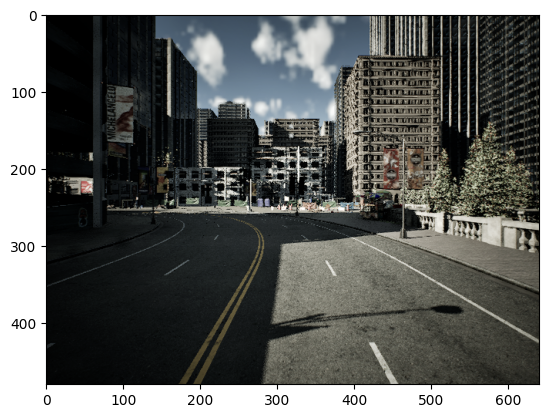

In [9]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [10]:
def segment_buildings(image, boxes):
    """Выделение зданий с помощью SAM"""
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    predictor.set_image(image_rgb)

    masks = []

    for box in boxes:
        mask, _, _ = predictor.predict(box=box.astype(int))
        masks.append(mask[0])
    
    return masks


def show_mask(mask, ax, color=(0, 0, 1)):
    """Функция для наложения маски на изображение"""
    mask = mask.astype(np.uint8)
    mask_image = np.zeros((*mask.shape, 4))
    mask_image[:, :, 0] = color[0]  # R
    mask_image[:, :, 1] = color[1]  # G
    mask_image[:, :, 2] = color[2]  # B
    mask_image[:, :, 3] = mask * 0.5  # Прозрачность
    
    ax.imshow(mask_image)


def visualize_results(image, boxes, masks):
    """Функция для отрисовки боксов и масок"""
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(image_rgb)

    # Отрисовка боксов
    for box in boxes:
        x_min, y_min, x_max, y_max = box.astype(int)
        ax.add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, 
                                   edgecolor="red", linewidth=2, fill=False))

    colors = [(0, 0, 1), (0, 1, 0), (1, 0, 0)]  # Синий, зеленый, красный
    for i, mask in enumerate(masks):
        show_mask(mask, ax, color=colors[i % len(colors)])

    ax.axis("off")
    plt.title("Выделение зданий (Grounding DINO + SAM)")
    plt.show()


image = cv2.imread(image_path)

# boxes = detect_buildings(image, 0.5)

# masks = segment_buildings(image, boxes)

# visualize_results(image, boxes, masks)

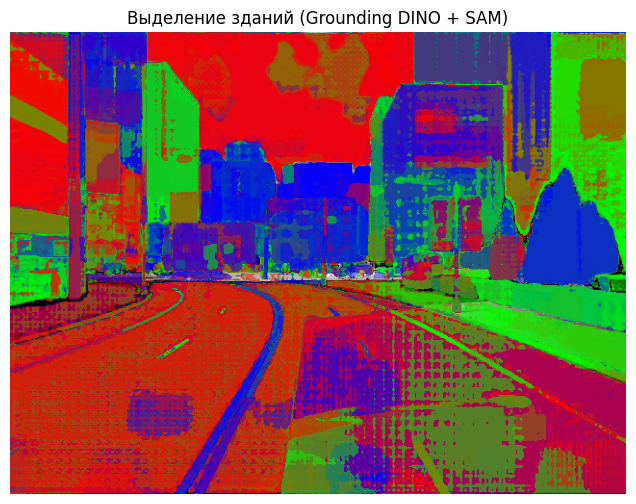

In [39]:
visualize_results(image, boxes, masks)

In [11]:
def visualize_results(image, boxes, masks):
    """Функция для отрисовки боксов и масок"""
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(image_rgb)

    # Отрисовка боксов
    for box in boxes:
        x_min, y_min, x_max, y_max = box.astype(int)
        ax.add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, 
                                   edgecolor="red", linewidth=2, fill=False))

    # Наложение масок
    colors = [(0, 0, 1), (0, 1, 0), (1, 0, 0)]  # Синий, зеленый, красный
    for i, mask in enumerate(masks):
        show_mask(mask, ax, color=colors[i % len(colors)])

    ax.axis("off")
    plt.title("Выделение зданий (Grounding DINO + SAM)")
    plt.show()

___

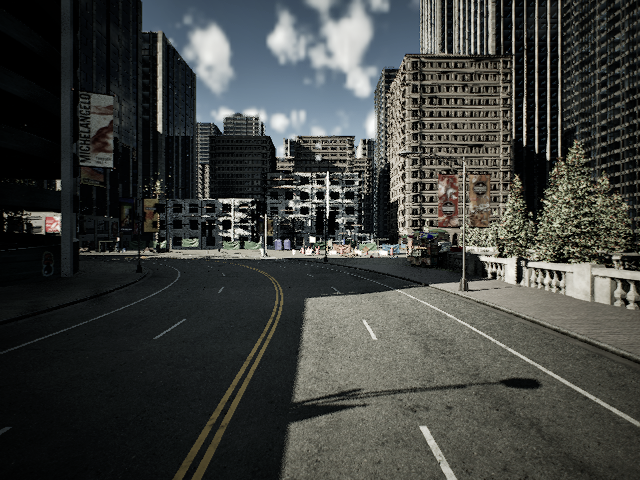

In [12]:
Image.open(image_path)

In [13]:
text_labels = [["a building, a road"]]

image_pil = Image.open(image_path)

inputs = dino_processor(images=image_pil, text=text_labels, return_tensors="pt").to("cuda")

with torch.no_grad():
    outputs = dino_model(**inputs)

results = dino_processor.post_process_grounded_object_detection(
    outputs,
    inputs.input_ids,
    box_threshold=0.4,
    text_threshold=0.3,
    target_sizes=[image_pil.size[::-1]]
)

# result = results[0]
for result in results:
    for box, score, labels in zip(result["boxes"], result["scores"], result["labels"]):
        box = [round(x, 2) for x in box.tolist()]
        print(f"Detected {labels} with confidence {round(score.item(), 3)} at location {box}")

Detected road with confidence 0.404 at location [2.29, 251.99, 637.56, 477.34]
Detected a building with confidence 0.404 at location [381.14, 50.55, 516.91, 246.61]


C:\Users\grigo\AppData\Roaming\Python\Python39\site-packages\transformers\models\grounding_dino\processing_grounding_dino.py:95: FutureWarning: The key `labels` is will return integer ids in `GroundingDinoProcessor.post_process_grounded_object_detection` output since v4.51.0. Use `text_labels` instead to retrieve string object names.
  warnings.warn(self.message, FutureWarning)


In [14]:
np.array([[382.2, 50.91, 516.18, 245.28]], dtype=np.float64)

array([[382.2 ,  50.91, 516.18, 245.28]])

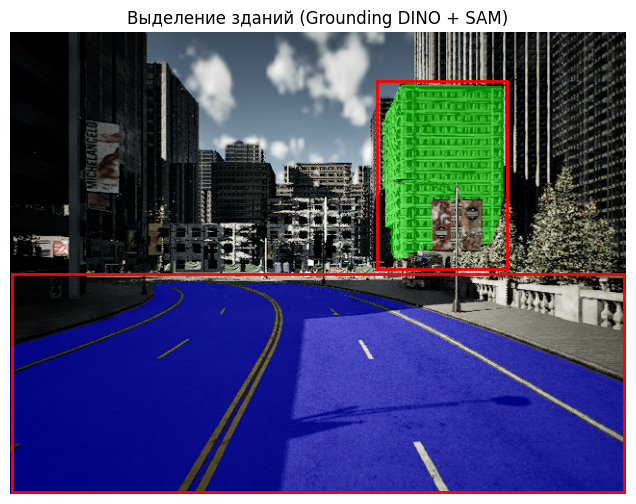

In [15]:
boxes = np.array([[2.29, 251.99, 637.56, 477.34], [381.14, 50.55, 516.91, 246.61]], dtype=np.float64)

masks = segment_buildings(image, boxes)

visualize_results(image, boxes, masks)

Это заняло 8 гигабайт VRAM.

In [16]:
import gc
del sam
torch.cuda.empty_cache()
gc.collect()

2997

In [17]:
del results
torch.cuda.empty_cache()
gc.collect()

0

Без SAM примерно 3900.
Всё ещё можно оптимизировать, взяв маленькие модели.

# Тест автоматического выделения масок:

https://www.freecodecamp.org/news/use-segment-anything-model-to-create-masks/

In [18]:
sam_checkpoint = "weights/sam_vit_h_4b8939.pth"
sam = sam_model_registry["vit_h"](checkpoint=sam_checkpoint).to("cuda")
predictor = SamPredictor(sam)

In [19]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

In [20]:
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.9,
    stability_score_thresh=0.96,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,
)

image= cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

output_mask = mask_generator.generate(image_rgb)
len(output_mask)

129

In [21]:
def show_output(result_dict,axes=None):
     if axes:
        ax = axes
     else:
        ax = plt.gca()
        ax.set_autoscale_on(False)
     sorted_result = sorted(result_dict, key=(lambda x: x['area']),      reverse=True)
     # Plot for each segment area
     for val in sorted_result:
        mask = val['segmentation']
        img = np.ones((mask.shape[0], mask.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
            ax.imshow(np.dstack((img, mask*0.5)))

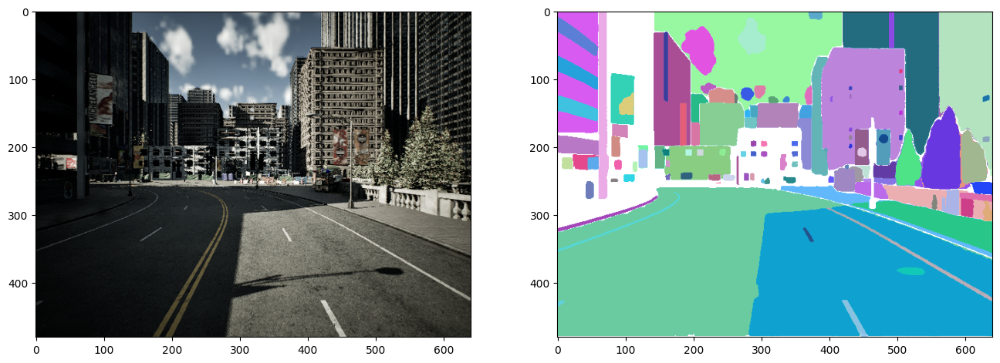

In [21]:
_,axes = plt.subplots(1,2, figsize=(16,16))
axes[0].imshow(image_rgb)
show_output(output_mask, axes[1])

Не подходит, так как занимает много времени, а объекты (в том числе нужные здания) сегментируются "рвано".

___

In [22]:
dino_processor_tiny = AutoProcessor.from_pretrained("IDEA-Research/grounding-dino-tiny")
dino_model_tiny = AutoModelForZeroShotObjectDetection.from_pretrained("IDEA-Research/grounding-dino-tiny").to("cuda")

In [23]:
text_labels = ["building", "road"]

image_pil = Image.open(image_path)

inputs = dino_processor_tiny(images=image_pil, text=text_labels, return_tensors="pt").to("cuda")

with torch.no_grad():
    outputs = dino_model_tiny(**inputs)

results = dino_processor_tiny.post_process_grounded_object_detection(
    outputs,
    inputs.input_ids,
    box_threshold=0.3,
    text_threshold=0.25,
    target_sizes=[image_pil.size[::-1]]
)

for result in results:
    for box, score, label in zip(result["boxes"], result["scores"], result["labels"]):
        print(f"{label}: {round(score.item(), 3)} — {box}")

road: 0.507 — tensor([  1.3319, 253.8861, 638.7042, 478.5686], device='cuda:0')
building: 0.465 — tensor([382.6554,  51.8487, 515.3185, 249.7529], device='cuda:0')
building: 0.378 — tensor([139.6895,  29.4090, 196.8797, 248.3021], device='cuda:0')
building: 0.315 — tensor([270.9271, 134.5379, 371.8859, 246.2541], device='cuda:0')
building: 0.313 — tensor([208.7883, 133.2822, 275.9457, 243.7700], device='cuda:0')
building: 0.344 — tensor([4.1908e+02, 3.5527e-01, 6.3936e+02, 2.5204e+02], device='cuda:0')


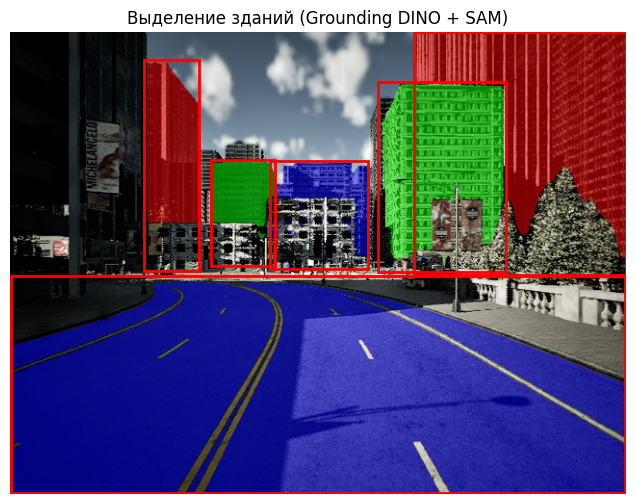

In [24]:
boxes = np.array([[1.3319, 253.8861, 638.7042, 478.5686], [382.6554,  51.8487, 515.3185, 249.7529],
                 [139.6895,  29.4090, 196.8797, 248.3021], [270.9271, 134.5379, 371.8859, 246.2541],
                 [208.7883, 133.2822, 275.9457, 243.7700], [4.1908e+02, 3.5527e-01, 6.3936e+02, 2.5204e+02]], dtype=np.float64)

masks = segment_buildings(image, boxes)

visualize_results(image, boxes, masks)

tiny модель Grounding DINO занимает в памяти GPU 829 MiB. Результаты аналогичны base модели.

Более автоматическое решение теперь только для зданий:

In [25]:
results

[{'scores': tensor([0.5066, 0.4652, 0.3776, 0.3155, 0.3133, 0.3442], device='cuda:0'),
  'boxes': tensor([[1.3319e+00, 2.5389e+02, 6.3870e+02, 4.7857e+02],
          [3.8266e+02, 5.1849e+01, 5.1532e+02, 2.4975e+02],
          [1.3969e+02, 2.9409e+01, 1.9688e+02, 2.4830e+02],
          [2.7093e+02, 1.3454e+02, 3.7189e+02, 2.4625e+02],
          [2.0879e+02, 1.3328e+02, 2.7595e+02, 2.4377e+02],
          [4.1908e+02, 3.5527e-01, 6.3936e+02, 2.5204e+02]], device='cuda:0'),
  'text_labels': ['road',
   'building',
   'building',
   'building',
   'building',
   'building'],
  'labels': ['road',
   'building',
   'building',
   'building',
   'building',
   'building']}]

In [26]:
def segment_image(image_path, visualize=True):
    text_labels = ["building"]
    image_pil = Image.open(image_path)
    inputs = dino_processor_tiny(images=image_pil, text=text_labels, return_tensors="pt").to("cuda")
    
    with torch.no_grad():
        outputs = dino_model_tiny(**inputs)
    
    results = dino_processor_tiny.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        threshold=0.3,
        target_sizes=[image_pil.size[::-1]]
    )
    
    boxes = results[0]["boxes"].cpu().numpy()
    masks = segment_buildings(image, boxes)
    
    print(f"Количество найденных объектов: {len(boxes)}")

    if visualize:
        visualize_results(image, boxes, masks)

Количество найденных объектов: 8


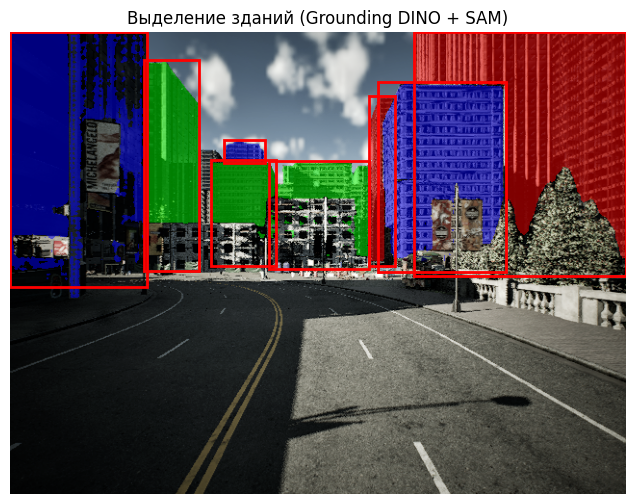

In [27]:
segment_image(image_path)

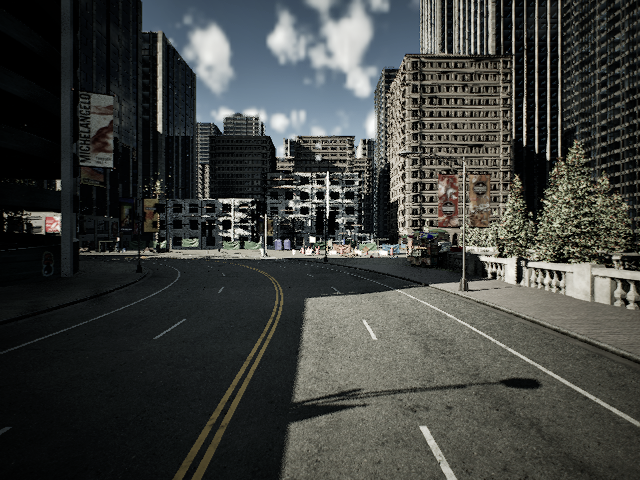

In [28]:
Image.open(image_path)

Результат не самый лучший, некоторые здания могут пойти в базу данных как обрывки (левое здание).  
Можно будет проверить результаты только с Grounding DINO, без SAM. Такой подход будет более производительный, но эмбеддинги получатся слишком общими.

Проверка устойчивости найденных сегментов:

In [29]:
timestamps

['1742509138810435328',
 '1742509142709221376',
 '1742509146304881664',
 '1742509149832348928',
 '1742509153325497856',
 '1742509156801687808',
 '1742509160308604672',
 '1742509163859516416',
 '1742509167510660608',
 '1742509171148720128']

In [30]:
import time

In [31]:
start_time = time.time()

for t in timestamps:
    start_time_l = time.time()
    image_path_ = os.path.join(source_dir, "images", f"{sample_timestamp}.png")
    segment_image(image_path_, visualize=False)
    end_time_l = time.time()
    print(f"Время одной сегментации: {end_time_l - start_time_l} с")

end_time = time.time()
print(f"Общее время выполнения: {end_time - start_time} с")

Количество найденных объектов: 8
Время одной сегментации: 1.3744356632232666 с
Количество найденных объектов: 8
Время одной сегментации: 1.0939228534698486 с
Количество найденных объектов: 8
Время одной сегментации: 1.0952773094177246 с
Количество найденных объектов: 8
Время одной сегментации: 1.1268877983093262 с
Количество найденных объектов: 8
Время одной сегментации: 1.0961649417877197 с
Количество найденных объектов: 8
Время одной сегментации: 1.1109771728515625 с
Количество найденных объектов: 8
Время одной сегментации: 1.1013855934143066 с
Количество найденных объектов: 8
Время одной сегментации: 1.105654239654541 с
Количество найденных объектов: 8
Время одной сегментации: 1.096534013748169 с
Количество найденных объектов: 8
Время одной сегментации: 1.1322276592254639 с
Общее время выполнения: 11.33547306060791 с


По времени неплохо.

Количество найденных объектов: 8


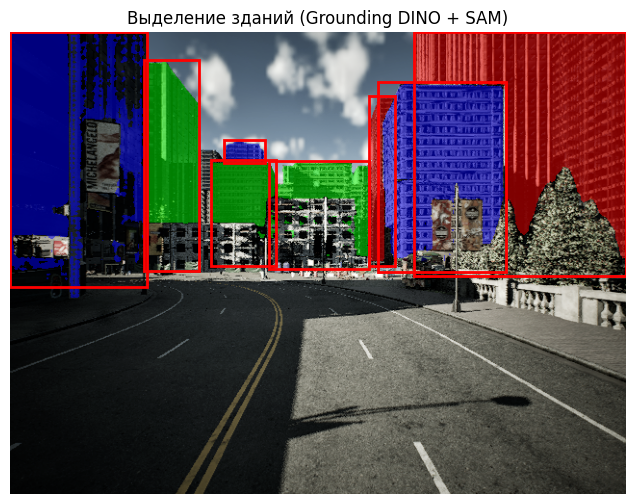

Количество найденных объектов: 8


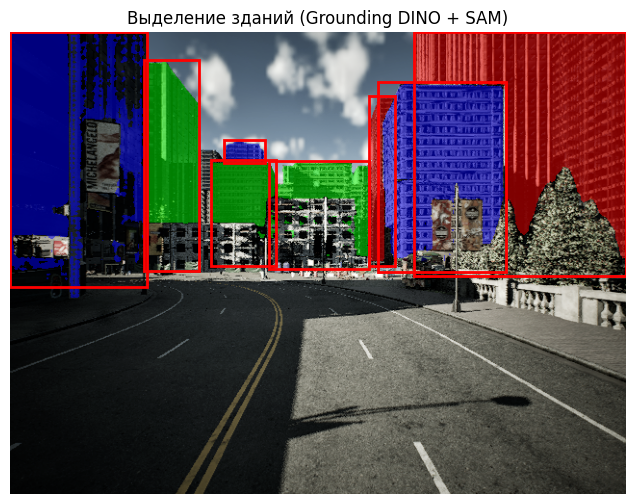

Количество найденных объектов: 8


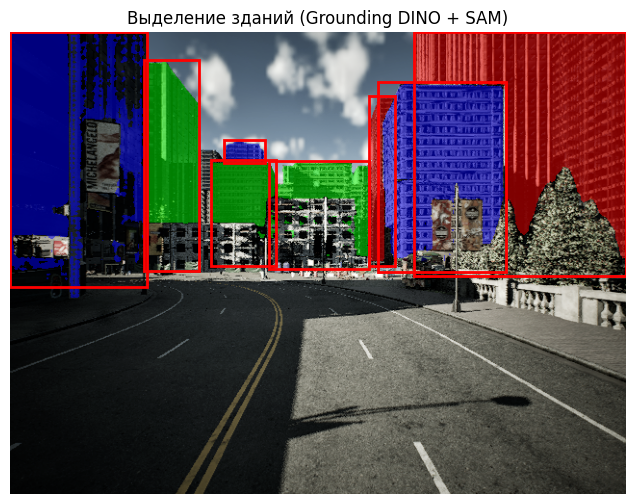

Количество найденных объектов: 8


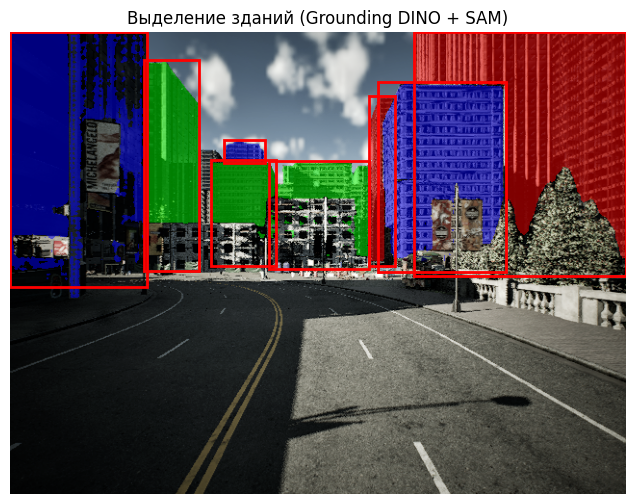

Количество найденных объектов: 8


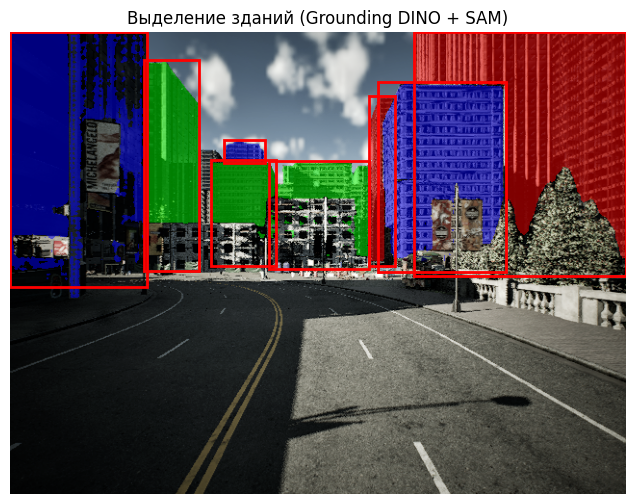

Количество найденных объектов: 8


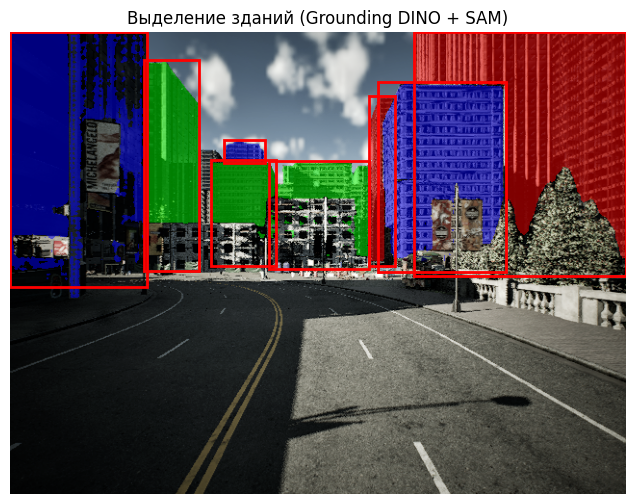

Количество найденных объектов: 8


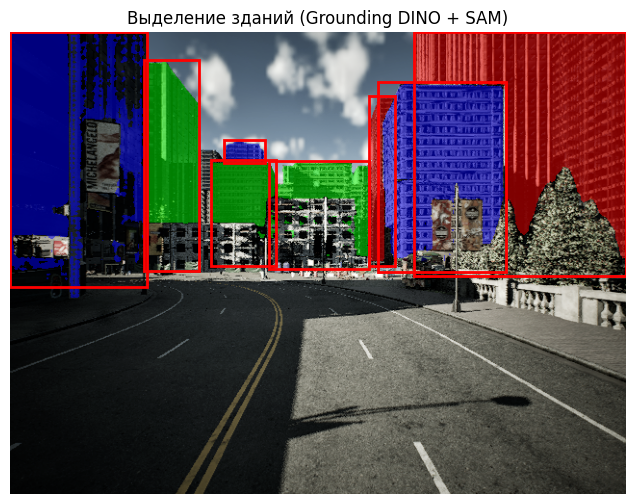

Количество найденных объектов: 8


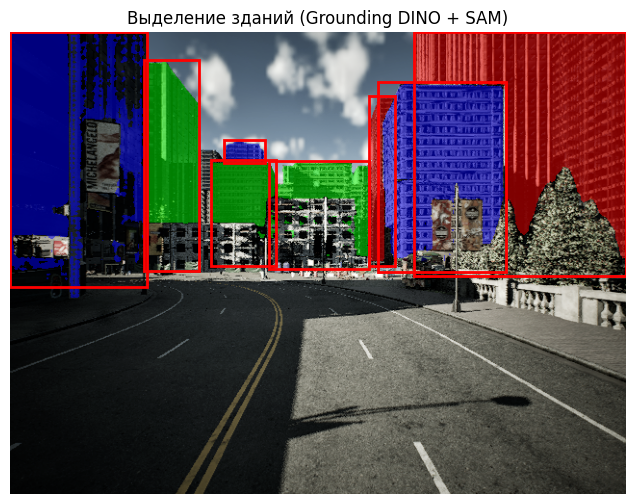

Количество найденных объектов: 8


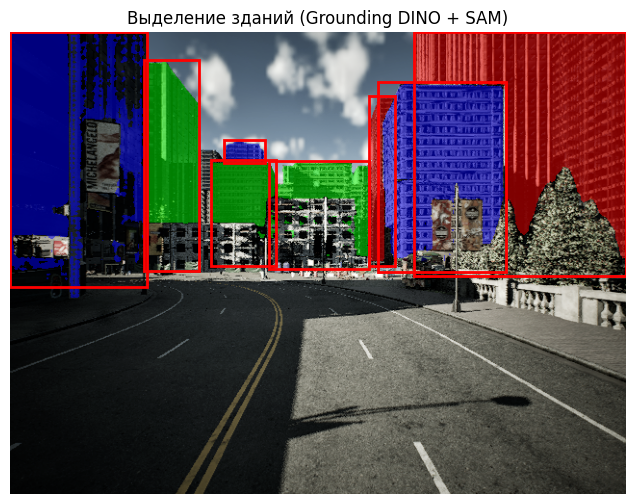

Количество найденных объектов: 8


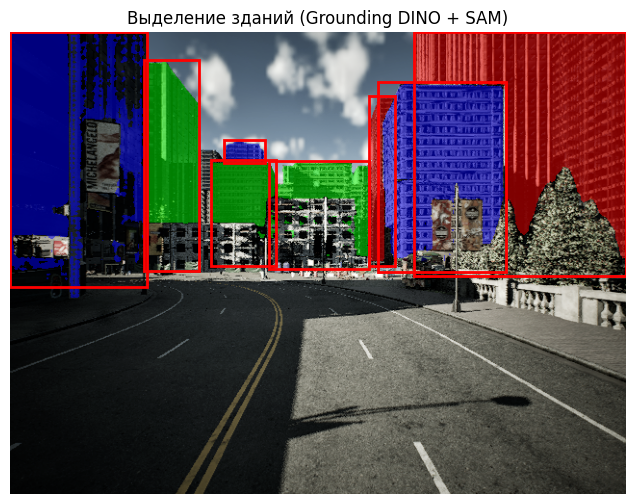

In [32]:
for t in timestamps:
    image_path_ = os.path.join(source_dir, "images", f"{sample_timestamp}.png")
    segment_image(image_path_)

Связка устойчивая, поэтому можно попробовать получать координаты зданий через триангуляцию кадров с заданным интервалом.

# Очистка мусора

In [33]:
del dino_model
del dino_processor

import gc
gc.collect()
torch.cuda.empty_cache()

In [34]:
del sam
del predictor

del clip_processor
del clip_model

import gc
gc.collect()
torch.cuda.empty_cache()